In [1]:
import spacy
import os
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.optim.lr_scheduler as lr_scheduler
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torchmetrics.classification import BinaryF1Score

from gensim.models import Word2Vec

from sklearn.model_selection import train_test_split

In [2]:
PATH = '../data/text_file.csv'

dataDF = pd.read_csv(PATH)
dataDF.drop('Unnamed: 0', axis = 1, inplace = True)
dataDF


,text,label
0,거미막하강내에서 출혈이 일어나 뇌척수액에 피가 섞인 상태로 지주막하출혈이 라...,1
1,원인질환으로는 중년 이후의 뇌동맥류 파열이 압도적으로 많으며 그밖에 뇌동정맥기형...,1
2,격심한 두통 및 구역질 구토증상이 있으며 의식장애가 나타난다,1
3,타각적으로는 목이 뻣뻣해지는 등 수막자극징후가 인정된다,1
4,재출혈이 일어나는 경우가 많고 특히 발작 후 주 이내는 그 빈도수가 뚜렷하게...,1
...,...,...
2091,그 밖에 누공형성 요로 손상 수술창부 내막증 등도 있다,0
2092,특히 문제가 되는 것은 다음 분만을 할 때 자궁파열의 위험이 따르는 것이다,0
2093,그러므로 제왕절개 후 시기를 보아서 자궁난관조영을 시행하여 봉합 부위에 대한 조영제...,0
2094,분류수술식은 경복막 제왕절개술 복막외 제왕절개술 등의 보존적 제왕절개술 ...,0


In [3]:
features = dataDF['text']
target = dataDF['label']

X_train, X_test, y_train, y_test = train_test_split(features,
                                                    target,
                                                    test_size = 0.2,
                                                    random_state = 42,
                                                    stratify = target)


In [4]:
# 불용어 처리 (Spacy)

TOKEN_MODEL = 'ko_core_news_lg'

nlp = spacy.load(TOKEN_MODEL)

# Spacy 내장 stopwords가 많지 않아, txt파일로 추가
nlp.Defaults.stop_words

{'가',
 '같',
 '것',
 '그',
 '그것',
 '그러',
 '그러나',
 '그런',
 '그렇',
 '그리고',
 '나',
 '년',
 '놓',
 '다른',
 '더',
 '데',
 '되',
 '두',
 '들',
 '등',
 '때',
 '때문',
 '또',
 '많',
 '말',
 '말하',
 '못하',
 '받',
 '번',
 '보',
 '살',
 '수',
 '시키',
 '싶',
 '아니',
 '안',
 '않',
 '알',
 '어떤',
 '어떻',
 '없',
 '오',
 '원',
 '위하',
 '이',
 '이렇',
 '일',
 '있',
 '잘',
 '점',
 '좀',
 '좋',
 '주',
 '지',
 '크',
 '하',
 '하나',
 '한'}

In [5]:
# 깃허브에 공유되어 있는 한국어 불용어 리스트
STOPWORDS_PATH = '../data/stopwords-ko.txt'

with open(STOPWORDS_PATH) as f:
    stopwords = f.read().split('\n')

# Spacy의 내장 불용어 리스트가 set이므로 중복을 신경쓰지 않고, 바로 추가
for word in stopwords:
    nlp.Defaults.stop_words.add(word)
    
    # 불용어 리스트에 단어를 넣어도, 속성 변경을 하지 않으면 불용어 처리를 하지 않음
    nlp.vocab[word].is_stop = True

In [6]:
# 커스텀 데이터셋 생성
class TextDataset(Dataset):
    def __init__(self, feature, label):
        self.feature = feature
        self.label = label
        self.n_rows = feature.shape[0]

    def __len__(self):
        return self.n_rows
    
    def __getitem__(self, index):
        return self.feature.iloc[index], self.label.iloc[index]

In [7]:
dataDS = TextDataset(features, target)
trainDS = TextDataset(X_train, y_train)
testDS = TextDataset(X_test, y_test)

In [8]:
for feature, label in trainDS:
    print(feature, label)
    break

     일반적으로 여성 호르몬의 혈중 농도가 낮아져  에 반응하지 않고  혈관  운동  신경증상이 나타난다 0


In [9]:
def generateToken(dataset):
    for text, label in dataset:
        token_list = []
        doc = nlp(text)

        for token in doc:
            if (not token.is_punct) and (not token.is_stop) and (not token.is_space):
                token_list.append(str(token))
        yield token_list

In [10]:
token_generator = generateToken(dataDS)
train_token_generator = generateToken(trainDS)
test_token_generator = generateToken(testDS)

In [11]:
# 한번에 많은 양의 데이터를 출력하면, Visual Studio가 꺼지므로, 조금만 출력하기 위한 함수
def check_data(data):
    i = 0
    for _ in data:
        print(_)
        i += 1
        if i == 10:
            break

In [12]:
check_data(train_token_generator)

['여성', '호르몬의', '혈중', '농도가', '낮아져', '반응하지', '않고', '혈관', '운동', '신경증상이']
['대체로', '경구용', '초기에', '사용되고', '환자의', '경구흡수의', '불확실성을', '피하기', '주사제', '사용된다']
['코에', '인접한', '부비강에', '염증으로', '전염성이', '병원체에', '일어난다']
['기침과', '담이', '기관지염', '증세와', '비슷한', '양상을', '나타낸다']
['폐결핵', '폐농양', '기관지', '확장증', '합병증으로', '폐파열은', '일단은', '증후성', '기흉', '구별하고']
['호흡운동을', '통한', '치료는', '횡경막운동을', '강화시킴으로써', '폐기능을', '개선시킬']
['근육내에', '주사하면', '충분하다']
['심방세동', '급성', '증상이', '나타난지', '개월이내', '증상이', '심하면', '직류전기적', '심율동전환', '효과적이다']
['약물요법', '변비는', '기저질환이나', '신체', '이상의', '증상으로', '것이므로', '시작하기', '전에', '심각한', '질환이', '존재하는지의', '여부를', '확인하는', '매우', '중요하다']
['보존요법이나', '약물요법으로', '치료가', '되지', '않을', '수술을', '고려할']


In [13]:
token_freqs = {}

for token_list in token_generator:
    for token in token_list:
        if token not in token_freqs:
            token_freqs[token] = 1
        else:
            token_freqs[token] += 1

In [14]:
sorted_tokens = sorted(token_freqs.items(), key = lambda x: x[1], reverse = True)

In [15]:
sorted_tokens

[('증상이', 85),
 ('약물요법', 54),
 ('통증이', 51),
 ('만성', 35),
 ('급성', 35),
 ('항생제', 34),
 ('기관지', 33),
 ('감염', 29),
 ('갑상선', 29),
 ('약', 28),
 ('질환', 26),
 ('치료', 25),
 ('투여한다', 25),
 ('염증이', 25),
 ('환자의', 24),
 ('증상을', 24),
 ('발열', 24),
 ('두통', 23),
 ('심장', 23),
 ('세', 23),
 ('후', 22),
 ('일반요법', 22),
 ('일어난다', 22),
 ('통증', 22),
 ('통증을', 22),
 ('사용할', 21),
 ('나타날', 20),
 ('될', 20),
 ('실시한다', 20),
 ('발생한다', 19),
 ('후에', 19),
 ('바이러스', 19),
 ('통해', 18),
 ('알려져', 18),
 ('않도록', 18),
 ('감염에', 18),
 ('의하여', 18),
 ('있으나', 18),
 ('상태를', 18),
 ('자주', 18),
 ('질', 18),
 ('없고', 17),
 ('것이다', 17),
 ('갑자기', 17),
 ('있거나', 17),
 ('치료가', 17),
 ('효과가', 17),
 ('치료는', 17),
 ('기립성', 17),
 ('출혈이', 16),
 ('되어', 16),
 ('더욱', 16),
 ('증상', 16),
 ('염증', 16),
 ('질환이', 16),
 ('분류', 16),
 ('호르몬', 16),
 ('이상의', 16),
 ('폐렴', 16),
 ('호르몬의', 16),
 ('계속', 15),
 ('인한', 15),
 ('중요한', 15),
 ('일으킬', 15),
 ('항생제를', 15),
 ('나타나며', 15),
 ('폐쇄성', 15),
 ('구토', 15),
 ('심부전', 15),
 ('사용', 15),
 ('기침', 15),
 ('완전히', 15),
 ('증상은', 14),
 (

In [16]:
PAD_TOKEN, OOV_TOKEN = 'pad', 'oov'

vocab = {PAD_TOKEN : 0, OOV_TOKEN : 1}

In [17]:
for index, token in enumerate(sorted_tokens, 2):
    vocab[token[0]] = index

In [18]:
check_data(vocab)

pad
oov
증상이
약물요법
통증이
만성
급성
항생제
기관지
감염


In [19]:
with open('vocab.pkl', 'wb') as f:
    pickle.dump(vocab, f)

In [20]:
def numbering(generator):
    encoded_data = []

    for token_list in generator:
        L = []
        for token in token_list:
            if token in vocab:
                L.append(vocab[token])
            else:
                L.append(vocab[OOV_TOKEN])
        encoded_data.append(L)
    return encoded_data

In [21]:
train_token_generator = generateToken(trainDS)
test_token_generator = generateToken(testDS)


In [22]:
train_ids = numbering(train_token_generator)
test_ids = numbering(test_token_generator)

In [23]:
check_data(train_ids)
print()
check_data(test_ids)

[173, 61, 1007, 306, 7862, 769, 142, 107, 137, 7863]
[2791, 452, 554, 431, 16, 7684, 7685, 1848, 7686, 89]
[6140, 6141, 6142, 959, 300, 6143, 24]
[683, 1427, 937, 6069, 2499, 6070, 181]
[2404, 5660, 8, 2381, 134, 5661, 5662, 850, 101, 5663]
[2449, 766, 49, 7017, 7018, 7019, 7020]
[1572, 1028, 8597]
[1340, 6, 2, 5177, 5178, 2, 906, 2259, 2260, 489]
[3, 8442, 8443, 3004, 59, 455, 8444, 8445, 384, 625, 56, 8446, 910, 8447, 149, 100]
[4609, 4610, 47, 117, 258, 141, 4611]

[3, 3606, 3607, 201, 1702, 3608, 107, 768, 127, 111, 112, 748, 3609, 3610, 3611, 327, 1118, 3612, 3613, 763]
[6902, 2377, 105, 904, 2669, 404, 300]
[7263, 10, 7264, 221, 7265, 7266, 5, 998, 10, 557, 7267, 2745, 7268, 997, 2672, 997, 1093, 7269]
[160, 425, 919, 1954, 240, 5381, 5382]
[1800, 3723, 3724, 1801, 1140, 3725, 3726, 3727, 779, 332, 3728, 18, 779, 566, 3729, 3730, 3731, 3732, 3733, 114]
[8726, 716, 8727, 3039, 8728, 871, 1793, 8729, 473, 1519]
[35, 237, 224, 2961, 9947, 9948]
[247, 10100, 3164, 73, 10101, 929]
[99

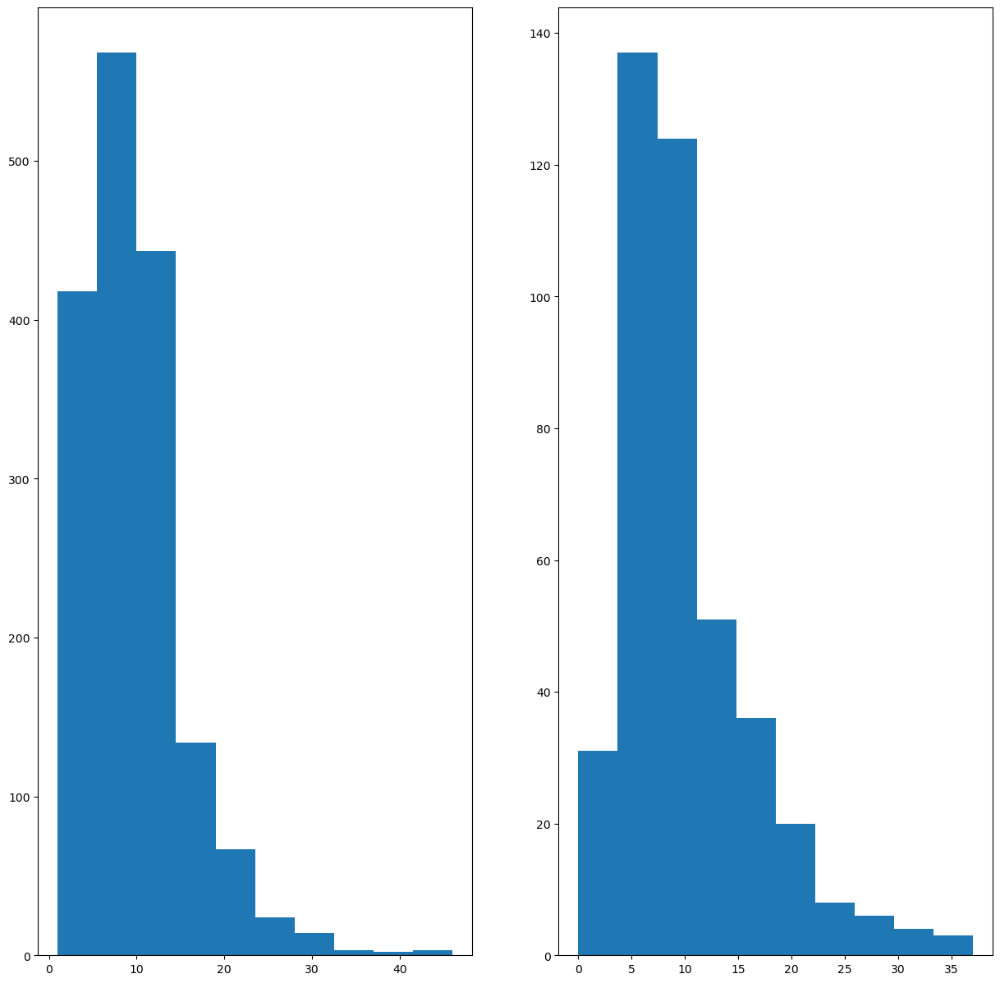

In [24]:
train_data_length = [len(data) for data in train_ids]
test_data_length = [len(data) for data in test_ids]

fig = plt.figure(figsize = (15, 15))
axes = fig.subplots(1, 2)
axes[0].hist(train_data_length)
axes[1].hist(test_data_length)

plt.show()

if max(train_data_length) > max(test_data_length):
    MAX_LENGTH = max(train_data_length)
else:
    MAX_LENGTH = max(test_data_length)

MAX_LENGTH = 20

In [25]:

def padding(data_ids):
    for index, data in enumerate(data_ids):
        current_length = len(data)
        if current_length < MAX_LENGTH:
            data_ids[index] = data + ([vocab[PAD_TOKEN]] * (MAX_LENGTH - current_length))
        else:
            data_ids[index] = data[ : MAX_LENGTH]

In [26]:
padding(train_ids)
padding(test_ids)

for data in train_ids[:5]:
    print(len(data), data)

print()

for data in test_ids[:5]:
    print(len(data), data)

20 [173, 61, 1007, 306, 7862, 769, 142, 107, 137, 7863, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
20 [2791, 452, 554, 431, 16, 7684, 7685, 1848, 7686, 89, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
20 [6140, 6141, 6142, 959, 300, 6143, 24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
20 [683, 1427, 937, 6069, 2499, 6070, 181, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
20 [2404, 5660, 8, 2381, 134, 5661, 5662, 850, 101, 5663, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

20 [3, 3606, 3607, 201, 1702, 3608, 107, 768, 127, 111, 112, 748, 3609, 3610, 3611, 327, 1118, 3612, 3613, 763]
20 [6902, 2377, 105, 904, 2669, 404, 300, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
20 [7263, 10, 7264, 221, 7265, 7266, 5, 998, 10, 557, 7267, 2745, 7268, 997, 2672, 997, 1093, 7269, 0, 0]
20 [160, 425, 919, 1954, 240, 5381, 5382, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
20 [1800, 3723, 3724, 1801, 1140, 3725, 3726, 3727, 779, 332, 3728, 18, 779, 566, 3729, 3730, 3731, 3732, 3733, 114]


In [27]:
# 커스텀 데이터셋 생성
class TextDataset2(Dataset):
    def __init__(self, feature, label):
        self.feature = feature
        self.label = label
        self.n_rows = feature.shape[0]

    def __len__(self):
        return self.n_rows
    
    def __getitem__(self, index):
        return torch.IntTensor(self.feature.iloc[index]), torch.IntTensor(self.label.iloc[index])

In [28]:
# 수치화를 시긴 데이터로 데이터셋 생성
train_df = pd.DataFrame(train_ids)
y_train = pd.DataFrame(y_train)
test_df = pd.DataFrame(test_ids)
y_test = pd.DataFrame(y_test)

train_dataset = TextDataset2(train_df, y_train)
test_dataset = TextDataset2(test_df, y_test)

In [1]:
y_train

NameError: name 'y_train' is not defined

In [30]:
train_loader = DataLoader(train_dataset, batch_size = 16, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 16, shuffle = False)

In [31]:
token_generator = generateToken(dataDS)
train_token_generator = generateToken(trainDS)
test_token_generator = generateToken(testDS)

In [32]:
train_token_list = []

for token in token_generator:
    train_token_list.append(token)

train_token_list[:5]

[['거미막하강내에서', '출혈이', '일어나', '뇌척수액에', '피가', '섞인', '상태로', '지주막하출혈이', '라고도'],
 ['원인질환으로는',
  '중년',
  '이후의',
  '뇌동맥류',
  '파열이',
  '압도적으로',
  '많으며',
  '그밖에',
  '뇌동정맥기형',
  '고혈압성',
  '질환',
  '뇌동맥',
  '경화',
  '질환'],
 ['격심한', '두통', '구역질', '구토증상이', '의식장애가'],
 ['타각적으로는', '목이', '뻣뻣해지는', '수막자극징후가', '인정된다'],
 ['재출혈이', '많고', '발작', '후', '이내는', '빈도수가', '뚜렷하게', '높기', '절대', '안정을', '해야']]

In [33]:
MODEL_PATH = '../models/'

word2vec = Word2Vec(
    sentences = train_token_list,
    vector_size = 100,
    window = 5,
    min_count = 1,
    sg = 0,
    epochs = 30,
    max_final_vocab = None
)

word2vec.save(MODEL_PATH + 'word2vec.model')

In [34]:
## 생성된 모델 확인
word2vec = Word2Vec.load(MODEL_PATH + 'word2vec.model')

word = '호흡'

print(word2vec.wv[word])
print(word2vec.wv.most_similar(word, topn = 5))
print(word2vec.wv.similarity(w1 = word, w2 = '최근'))

[ 0.00679462 -0.00189922  0.00222317  0.00619362 -0.00813104 -0.01467588
 -0.00973858  0.01614393  0.00673749 -0.00026415 -0.01196865 -0.00162822
 -0.00712423 -0.0012368  -0.00247434 -0.00183101  0.00367776 -0.0072207
  0.00646202  0.00077045 -0.00357903  0.00655756  0.01209023 -0.00129621
 -0.00011197 -0.00739771 -0.00109821 -0.00560291  0.00395662  0.00684372
 -0.00482459  0.00480799 -0.00139418 -0.00015188 -0.00430702 -0.00466903
 -0.00223439  0.00267559  0.00336738 -0.00132265  0.00096973 -0.00227518
  0.00643437  0.00590502 -0.00311671  0.00089986 -0.00606771 -0.00102362
 -0.00451327  0.01135184  0.00053009 -0.0072696  -0.00501898  0.00116216
 -0.00400697 -0.00576189 -0.00595103  0.00454395 -0.0070532  -0.00889077
  0.00469943  0.00119348 -0.00978615 -0.00233984 -0.00909492 -0.00571977
 -0.00642355 -0.00172467 -0.00662759 -0.00346225 -0.00676298 -0.00675592
 -0.00407743  0.00562124  0.00937706 -0.00231933 -0.00249521 -0.00707043
 -0.0017744   0.00027262 -0.00772654 -0.00766119 -0.

In [35]:
# word2vec의 vector_size와 embedding_dim의 크기가 같아야 되는거 같다.

n_vocab = len(vocab)
hidden_dim = 64
embedding_dim = 100
n_layers = 2

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [36]:
# 임베딩 - word2vec의 max_final_vocab을 제한해 버리면,
# sentences 파라미터에 들어가는 토큰 수가 클 수록, 임베딩이 되지 않는 경우가 생김
# 이번엔 제한 없이 했지만, 단어 사전 수를 제한해서 빈도 수가 적은 애들은 
# 메모리를 생각해서 전부 oov로 전환 시키는 것이 좋을 듯 하다.

init_embeddings = np.zeros((n_vocab, embedding_dim))

for token, index in vocab.items():
    if token not in [PAD_TOKEN, OOV_TOKEN]:
        init_embeddings[index] = word2vec.wv[token]


embedding_layer = nn.Embedding.from_pretrained(
    torch.tensor(init_embeddings, dtype = torch.float32)
)

In [37]:
check_data(init_embeddings)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
[-0.10968246  0.19987816  0.12442026  0.10584702 -0.01178284 -0.34133863
  0.01089331  0.42829171 -0.09034058 -0.19140479 -0.11755679 -0.36204085
 -0.03977299  0.08771559  0.08618307 -0.19593786  0.01262184 -0.20911501
  0.04886848 -0.37202528  0.11447997  0.01411368  0.21254329 -0.07988446
  0.07258323 -0.04095214 -0.03255435 -0.03059034 -0.26678452 -0.00796664
  0.14120421  0.0606044

In [38]:
# 문장 분류 모델 

class SentenceClassifier(nn.Module):
    def __init__(self,
                 n_vocab = n_vocab,
                 hidden_dim = hidden_dim,
                 embedding_dim = embedding_dim,
                 n_layers = n_layers,
                 dropout = 0.5,
                 # 양방향은 빈칸에 들어갈 단어를 고르는 등, 앞 문장과 뒷 문장이 둘 다 중요할 때 사용
                 bidirectional = True,
                 model_type = 'lstm',
                 pretrained_embedding = init_embeddings
                 ):
        super().__init__()

        if pretrained_embedding is not None:
            self.embedding = nn.Embedding.from_pretrained(
                torch.tensor(pretrained_embedding, dtype = torch.float32)
            )
        else:
            self.embedding = nn.Embedding(
                num_embeddings = n_vocab,
                embedding_dim = embedding_dim,
                padding_idx = 0
        )
        
        if model_type == 'rnn':
            self.model = nn.RNN(
                input_size = embedding_dim,
                hidden_size = hidden_dim,
                num_layers = n_layers,
                bidirectional = bidirectional,
                dropout = dropout,
                batch_first = True
            )
        elif model_type == 'lstm':
            self.model = nn.LSTM(
                input_size = embedding_dim,
                hidden_size = hidden_dim,
                num_layers = n_layers,
                bidirectional = bidirectional,
                dropout = dropout,
                batch_first = True
            )
        
        if bidirectional:
            self.classifier = nn.Linear(hidden_dim * 2, 1)

        else:
            self.classifier = nn.Linear(hidden_dim, 1)

        self.dropout = nn.Dropout(dropout)

    def forward(self, inputs):
        embeddings = self.embedding(inputs)
        output, _ = self.model(embeddings)
        last_output = output[:, -1, :]
        last_output = self.dropout(last_output)
        logits = self.classifier(last_output)
        return F.sigmoid(logits)

In [39]:
classifier = SentenceClassifier().to(DEVICE)

In [40]:
EPOCH = 1000
LR = 0.001

regLoss = nn.BCELoss()
optimizer = optim.Adam(classifier.parameters(), lr = LR)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'max', patience = 100, verbose = True)


c:\Users\KDP-2\anaconda3\envs\TEXT_018_230_38\lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [41]:
def testing(featureDF, targetDF):
    testTS = torch.LongTensor(featureDF.values).to(DEVICE)
    targetTS = torch.FloatTensor(targetDF.values).to(DEVICE)
    
    with torch.no_grad():
        pre_val = classifier(testTS)
        loss_val = regLoss(pre_val, targetTS)
        score_val = BinaryF1Score()(pre_val, targetTS)
        pred_labels = (pre_val >= 0.5).float()

    return loss_val, score_val, pred_labels

In [42]:
SAVE_PATH = './saved_models/'
os.makedirs(SAVE_PATH, exist_ok = True)

def training(valTS, valtargetTS):
    BREAK_CNT_LOSS = 0
    BREAK_CNT_SCORE = 0
    LIMIT_VALUE = 10

    LOSS_HISTORY, SCORE_HISTORY = [[], []], [[], []]

    for epoch in range(EPOCH):
        SAVE_MODEL = os.path.join(SAVE_PATH, f'model_{epoch}.pth')
        SAVE_FILE = os.path.join(SAVE_PATH, f'model_weights_{epoch}.pth')

        loss_total, score_total = 0, 0

        for featureTS, targetTS in train_loader:
            pre_y = classifier(featureTS)
            targetTS = targetTS.float()

            loss = regLoss(pre_y, targetTS)
            loss_total += loss.item()

            score = BinaryF1Score()(pre_y, targetTS)
            
            score_total += score.item()


            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        val_loss, val_f1, _ = testing(valTS, valtargetTS)
        print(_)
        LOSS_HISTORY[1].append(val_loss)
        SCORE_HISTORY[1].append(val_f1)

        LOSS_HISTORY[0].append(loss_total / len(train_loader))
        SCORE_HISTORY[0].append(score_total / len(train_loader))

        print(f"[{epoch + 1}/{EPOCH}]\n - TRAIN LOSS : {LOSS_HISTORY[0][-1]} F1 : {SCORE_HISTORY[0][-1]}")
        print(f"- VAL LOSS : {LOSS_HISTORY[1][-1]} F1 : {SCORE_HISTORY[1][-1]}")

        scheduler.step(val_f1)

            # 학습 진행 모니터링/스케쥴링 - 검증 DS 기준
        # Score 기준
        if len(SCORE_HISTORY[1]) >= 2:
            if SCORE_HISTORY[1][-1] >= SCORE_HISTORY[1][-2]: BREAK_CNT_SCORE += 1

        # 성능이 좋은 학습 가중치 저장

        if len(SCORE_HISTORY[1]) == 1:
            # 첫 번째라서 무조건 모델 파라미터 저장
            torch.save(classifier.state_dict(), SAVE_FILE)
            # 모델 전체 저장
            torch.save(classifier, SAVE_MODEL)
        else:
            if SCORE_HISTORY[1][-1] > max(SCORE_HISTORY[1][:-1]):
                torch.save(classifier.state_dict(), SAVE_FILE)
                torch.save(classifier, SAVE_MODEL)

        if BREAK_CNT_LOSS > LIMIT_VALUE:
            print(f'성능 및 손실 개선이 없어서 {epoch} EPOCH에 학습 중단')
            break

    return LOSS_HISTORY, SCORE_HISTORY


In [43]:
loss, f1 = training(test_df, y_test)

tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
      